In [18]:
import os
import numpy as np
import pandas as pd
import h5py
import scipy
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
from IPython.display import HTML
import MDAnalysis as md
from MDAnalysis.tests.datafiles import PSF, DCD, DCD2
from MDAnalysis.analysis.base import (AnalysisBase, AnalysisFromFunction, analysis_class)
import umap as UMAP


In [ ]:
#Function that creates the bin grid resulting in an ion map
def bin_plane(xyz, plane_size, L, num_bins, detector_eff=1.0, axis=1):
    if detector_eff > 1.0:
        raise ValueError("Detector efficiency cannot be over 100%.")

    # Create the grid
    grid_range = np.linspace(-plane_size / 2, plane_size / 2, num_bins)
    
    if axis == 0:
        grid = np.array([(-L, x, y) for y in grid_range for x in grid_range], dtype=np.float32)
        B1 = 1
        B2 = 2
    elif axis == 1:
        grid = np.array([(x, -L, y) for y in grid_range for x in grid_range], dtype=np.float32)
        B1 = 0
        B2 = 2
    elif axis == 2:
        grid = np.array([(x, y, -L) for y in grid_range for x in grid_range], dtype=np.float32)
        B1 = 1
        B2 = 0
    else:
        raise ValueError("Invalid axis value. Axis must be 0, 1, or 2.")
    
    # Filter out points that will never hit the plane based on their y-coordinate and the plane's location
    if L > 0:
        xyz = xyz[xyz[:, axis] < 0.0]  # Points above the plane when L > 0 will not hit
    elif L < 0:
        xyz = xyz[xyz[:, axis] > 0.0]  # Points below the plane when L < 0 will not hit

    # Calculate the hit locations on the plane
    k = -L / xyz[:, axis]
    hit_location = k[:, np.newaxis] * xyz

    # Initialize the bins
    bins = np.zeros((num_bins, num_bins), dtype=int)

    N = len(hit_location)
    M = int(detector_eff * N)
    
    keep_idx = np.random.choice(N, M, replace=False)
    hit_location = hit_location[keep_idx]

    # Process each hit location
    for hit in hit_location:
        # Check if the hit is within the plane bounds
        if -plane_size / 2 <= hit[B1] <= plane_size / 2 and -plane_size / 2 <= hit[B2] <= plane_size / 2:
            # Find the closest grid point for the hit location
            distance = scipy.spatial.distance.cdist([hit], grid)
            closest_bin = np.argmin(distance)

            # Convert the linear index to 2D index and increment the corresponding bin
            y_idx, x_idx = divmod(closest_bin, num_bins)
            bins[y_idx, x_idx] += 1

    return bins.astype(np.int16)

Dimensionality reduction functions

In [ ]:
def PCA_analysis(img_data, n_components=2):
    # Create a numpy array of shape (len(img_data), bins, bins)
    data_array = np.array(img_data) 
    
    # Reshape it into (len(img_data), bins*bins) so each row represents one sample
    data_matrix = data_array.reshape(len(img_data), -1) 
    
    # Apply PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(data_matrix)
    return transformed_data, pca

def TSNE_analysis(img_data, n_components=2, perplexity=50.0, random_state=None):
    # Convert the list of lists into a numpy array of shape (len(img_data), bins, bins)
    data_array = np.array(img_data)  
    
    # Reshape it into (len(img_data), bins*bins) so each row represents one sample
    data_matrix = data_array.reshape(len(img_data), -1)  
    
    # Apply TSNE
    tsne = TSNE(n_components=n_components, verbose=0, perplexity=perplexity, random_state=random_state)
    transformed_data = tsne.fit_transform(data_matrix)
    return transformed_data

def UMAP_analysis(img_data, n_components=2, n_neighbors=15, metric='euclidean', random_state=None):
    # Convert the list of lists into a numpy array of shape (len(img_data), bins, bins)
    data_array = np.array(img_data)  
    
    # Reshape it into (len(img_data), bins*bins) so each row represents one sample
    data_matrix = data_array.reshape(len(img_data), -1) 
    
    # Apply UMAP
    umap = UMAP.UMAP(n_components=n_components, n_neighbors=n_neighbors, metric=metric, random_state=random_state)
    transformed_data = umap.fit_transform(data_matrix)
    return transformed_data

#For sorting the lists
def extract_number(s):
    return int(''.join(filter(str.isdigit, s)))

#Normalization function
def normalize(img):
    img = np.array(img)
    return (img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8)


Exctract Radius of Gyration

In [ ]:
#What run and electric field
what_run = 'run0'
efield ='3e4'

# Taken from MDAnalysis webpage for "Writing your own trajectory analysis": https://userguide.mdanalysis.org/1.1.1/examples/analysis/custom_trajectory_analysis.html
def radgyr(atomgroup, masses, total_mass=None):
    # coordinates change for each frame
    coordinates = atomgroup.positions
    center_of_mass = atomgroup.center_of_mass()

    # get squared distance from center
    ri_sq = (coordinates-center_of_mass)**2
    # sum the unweighted positions
    sq = np.sum(ri_sq, axis=1)
    sq_x = np.sum(ri_sq[:,[1,2]], axis=1) # sum over y and z
    sq_y = np.sum(ri_sq[:,[0,2]], axis=1) # sum over x and z
    sq_z = np.sum(ri_sq[:,[0,1]], axis=1) # sum over x and y

    # make into array
    sq_rs = np.array([sq, sq_x, sq_y, sq_z])

    # weight positions
    rog_sq = np.sum(masses*sq_rs, axis=1)/total_mass
    # square root and return
    return np.sqrt(rog_sq)

#Get RoG
cwd_long = f'/home/mans/E_3e4/{what_run}'

u = md.Universe(f'{cwd_long}/long.gro', f'{cwd_long}/long.trr')
protein = u.select_atoms('protein')
idx = protein.indices

rog = md.analysis.base.AnalysisFromFunction(radgyr, u.trajectory,
                        protein, protein.masses,
                        total_mass=np.sum(protein.masses))
rog.run(start=0, stop=1001, step=10)

rog.results['timeseries'].shape

rog_list = []
labels = ['all', 'x-axis', 'y-axis', 'z-axis']

for col, label in zip(rog.results['timeseries'].T, labels):
    if label == 'all':
        rog_list.append(col)

one_run_rog = np.concatenate(rog_list).tolist()
print(len(one_run_rog))

#Repeat this RoG 100 times for each timestep, making 10100 values.
flattened_rog = []
for i in one_run_rog:
    for j in range(100):
        flattened_rog.append(i)

print(len(flattened_rog))

101
10100


/home/mans/.conda/envs/mdsenv/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/mans/.conda/envs/mdsenv/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/mans/.conda/envs/mdsenv/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Exctract position data from h5-file.

In [ ]:

cwd = f'/home/mans/moldstruct_python/3e4_{what_run}_100sims_mds'

fold_dirs = os.listdir(f'{cwd}')
fold_dirs.sort()
print(fold_dirs)

allsim_posdata = []

for fold in fold_dirs:
    for i in range(100):
        h5file = f'{cwd}/{fold}/sim{i}/data.h5'
        # Exctract the position data (unit displacement)
        with h5py.File(h5file, 'r') as file:   #how to open h5 file: h5dump name
            #Run 0 and run 8 were not given the same directory names. Thus, they are given an if/else statement to automize.
            if what_run =='run0':
                group_path ='ALL_FOLDS_1UBI'
            else:
                group_path ='run8_ALL_FOLDS_1UBI'
            group = file[group_path]
            pos_data = group["unit_displacement"][:]
        pos_data = np.array(pos_data)
        allsim_posdata.append(pos_data)

print(len(allsim_posdata))


['1ubi_000', '1ubi_001', '1ubi_002', '1ubi_003', '1ubi_004', '1ubi_005', '1ubi_006', '1ubi_007', '1ubi_008', '1ubi_009', '1ubi_010', '1ubi_011', '1ubi_012', '1ubi_013', '1ubi_014', '1ubi_015', '1ubi_016', '1ubi_017', '1ubi_018', '1ubi_019', '1ubi_020', '1ubi_021', '1ubi_022', '1ubi_023', '1ubi_024', '1ubi_025', '1ubi_026', '1ubi_027', '1ubi_028', '1ubi_029', '1ubi_030', '1ubi_031', '1ubi_032', '1ubi_033', '1ubi_034', '1ubi_035', '1ubi_036', '1ubi_037', '1ubi_038', '1ubi_039', '1ubi_040', '1ubi_041', '1ubi_042', '1ubi_043', '1ubi_044', '1ubi_045', '1ubi_046', '1ubi_047', '1ubi_048', '1ubi_049', '1ubi_050', '1ubi_051', '1ubi_052', '1ubi_053', '1ubi_054', '1ubi_055', '1ubi_056', '1ubi_057', '1ubi_058', '1ubi_059', '1ubi_060', '1ubi_061', '1ubi_062', '1ubi_063', '1ubi_064', '1ubi_065', '1ubi_066', '1ubi_067', '1ubi_068', '1ubi_069', '1ubi_070', '1ubi_071', '1ubi_072', '1ubi_073', '1ubi_074', '1ubi_075', '1ubi_076', '1ubi_077', '1ubi_078', '1ubi_079', '1ubi_080', '1ubi_081', '1ubi_082', '1u

Parameter inputs and running bin_plane

In [ ]:
plane_size = 200 #Plane size 
detector_distance = 50 #Detector distance 
num_bins = 30 #Number of bins (meaning how many bins that should fit the plane)

detector_eff = 1.0 # effciency of detector
axis = 0 #Where to place the detector relative to the reference frame of the data
# 0 -> x
# 1 -> y
# 2 -> z
if axis == 0:
    axis_xyz = 'x'
elif axis == 1:
    axis_xyz = 'y'
else:
    axis_xyz = 'z'

#For image
all_imgs= []

for pos_data in allsim_posdata:
    img = np.ndarray(shape=(num_bins,num_bins))
    img = bin_plane(pos_data,plane_size,detector_distance,num_bins,detector_eff,axis)
    all_imgs.append(img)

# Normalization of all ion maps (not mean maps) in relation to all images
all_norm = normalize(all_imgs)

Mean arrays and normalization for movies

In [ ]:
#Mean ion maps for single dataset
mean_imgs = []
for i in range(101):
    start = i*100
    end = (i+1)*100
    mean_imgs.append(sum(all_imgs[start:end])/len(all_imgs[start:end]))

#Normalization for each mean map is to get an easier visualization of the explosion shape evolution in movies, 
# Since we disregard intensity differences, the brightness between frames is unaltered.
norm_imgs = []
for img in mean_imgs:
    norm_imgs.append(normalize(img))

Detector image

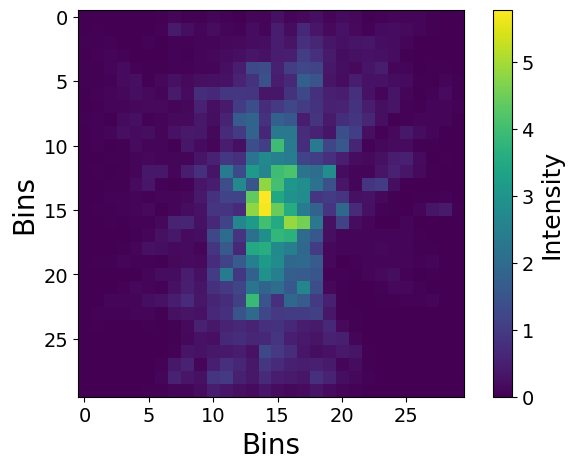

In [ ]:
# For detector image
fold_image = 100
plt.imshow(mean_imgs[fold_image])
cbar = plt.colorbar()
cbar.set_label('Intensity', fontsize=18)
cbar.ax.tick_params(labelsize=14)

plt.xlabel(f'Bins', fontsize=20)
plt.ylabel(f'Bins', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig(f'/home/mans/results/ionmaps_100sim_font/img_unnormalised{what_run}_{efield}_{axis_xyz}-axis_E{fold_image}_{plane_size}_{detector_distance}_{num_bins}.png')
plt.show()


Explosionmap Movie

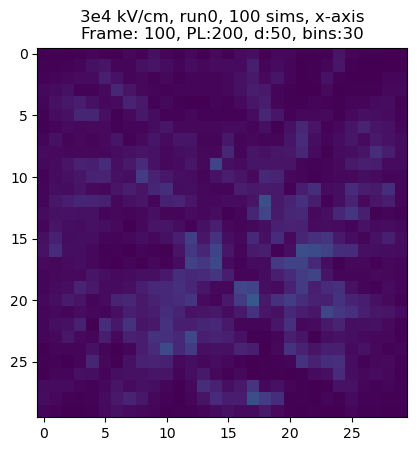

In [ ]:
import matplotlib.animation as animation
cax_frame = 0

# Set up the figure and axis
fig, ax = plt.subplots()
cax = ax.imshow(norm_imgs[cax_frame])
ax.set_title(f"")


# Function to update the plot for each frame
def update(frame):
    cax.set_data(mean_imgs[frame])
    ax.set_title(f"{efield} kV/cm, {what_run}, 100 sims, {axis_xyz}-axis\nFrame: {frame}, PL:{plane_size}, d:{detector_distance}, bins:{num_bins}")
    return cax,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(mean_imgs), interval=100, blit=True)

#Save the animation
save_path = f'/home/mans/results/normalized_movie_100sim_{what_run}_{efield}_{axis_xyz}_d{detector_distance}_bin{num_bins}.mp4'
saveit = input(f'Save?: ')
if saveit == 'y':
    ani.save(save_path, writer='ffmpeg', fps=10)

# Display the animation in the notebook
HTML(ani.to_jshtml())

Dimensionality reduction plots

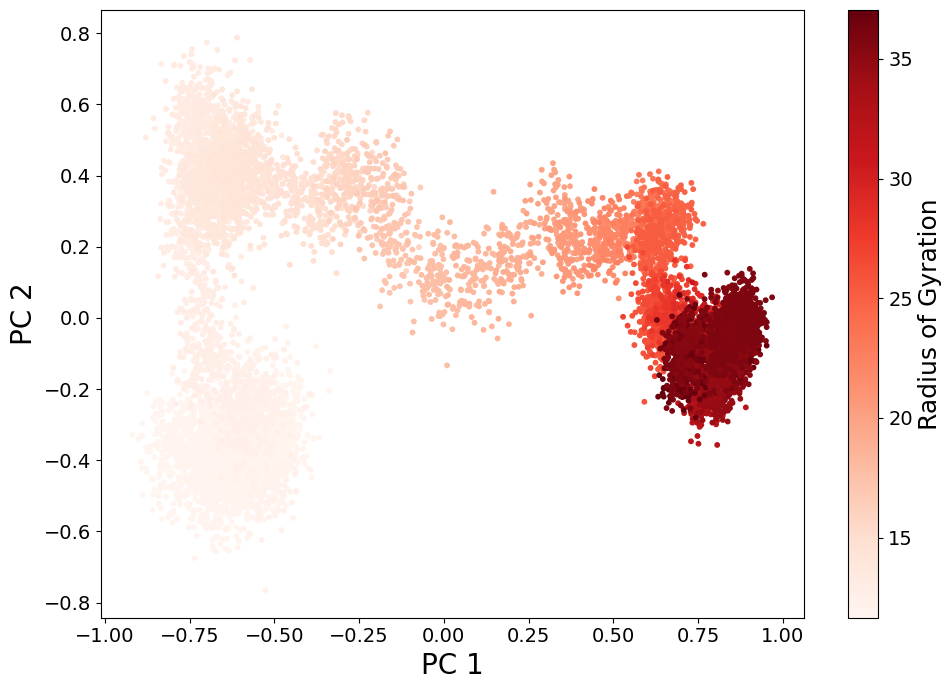

In [ ]:
#PCA 2D

pca_data, pca = PCA_analysis(all_norm, n_components=2)

plt.figure(figsize=(10, 7))
sc = plt.scatter(
    pca_data[:, 0], 
    pca_data[:, 1], 
    c=flattened_rog,     
    cmap='Reds',      
    s=10
)
cbar = plt.colorbar(sc)
cbar.set_label('Radius of Gyration', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Colorbar tick font size


plt.xlabel("PC 1", fontsize=20)
plt.ylabel("PC 2", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

plt.savefig(f'/home/mans/results/DR_plots/PCA_{what_run}_{axis_xyz}_d{detector_distance}_bin{num_bins}_norm.png')
plt.show()


Eigenfaces

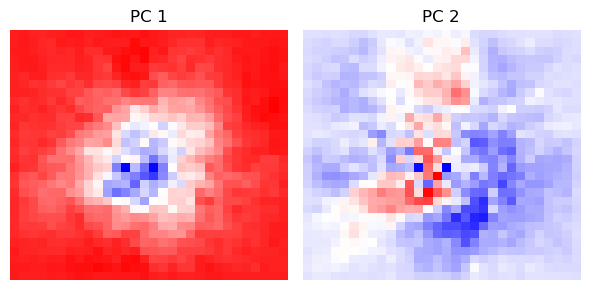

In [16]:
def plot_pca_eigenfaces(pca, n_lat, n_lon, n_components=2):
    fig, axes = plt.subplots(1, n_components, figsize=(3*n_components, 3))
    for i in range(n_components):
        ax = axes[i]

        # Each component is a vector, reshape to image
        img = pca.components_[i].reshape(n_lat, n_lon)   #(256//5+1, 256//5+1)
        ax.imshow(img, cmap='bwr', aspect='auto')
        ax.set_title(f'PC {i+1}')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_pca_eigenfaces(pca, num_bins, num_bins, n_components=2)

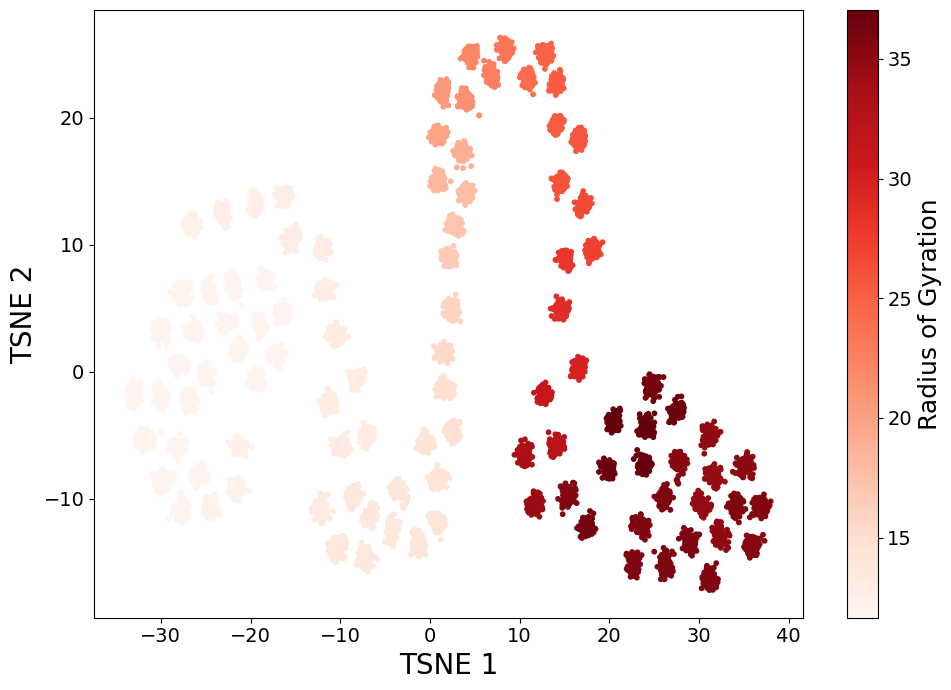

In [78]:
tsne_data = TSNE_analysis(all_norm, n_components=2, perplexity=500.0, random_state=None)

plt.figure(figsize=(10, 7))
sc = plt.scatter(
    tsne_data[:, 0], 
    tsne_data[:, 1], 
    c=flattened_rog,     
    cmap='Reds',      
    s=10
)
cbar = plt.colorbar(sc)
cbar.set_label('Radius of Gyration', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Colorbar tick font size


plt.xlabel("TSNE 1", fontsize=20)
plt.ylabel("TSNE 2", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

plt.savefig(f'/home/mans/results/DR_plots/TSNE_{what_run}_{axis_xyz}_d{detector_distance}_bin{num_bins}_norm.png')
plt.show()

30


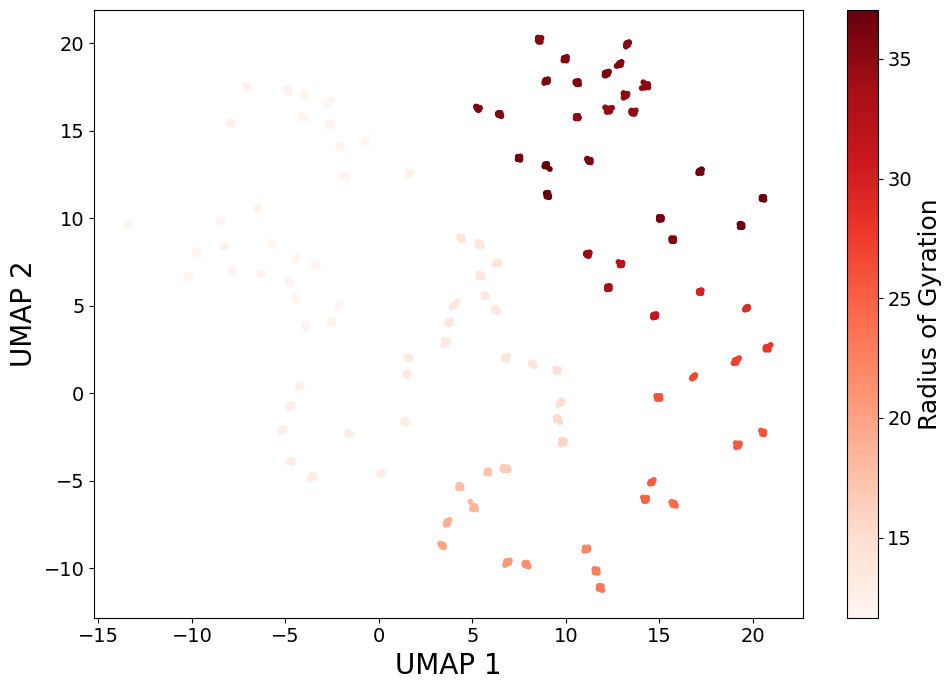

In [79]:
#UMAP 2D
print(num_bins)
umap_data = UMAP_analysis(all_norm, n_components=2, n_neighbors=100)

plt.figure(figsize=(10, 7))
sc = plt.scatter(
    umap_data[:, 0], 
    umap_data[:, 1], 
    c=flattened_rog,     
    cmap='Reds',      
    s=10
)
cbar = plt.colorbar(sc)
cbar.set_label('Radius of Gyration', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Colorbar tick font size


plt.xlabel("UMAP 1", fontsize=20)
plt.ylabel("UMAP 2", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

plt.savefig(f'/home/mans/results/DR_plots/UMAP_{what_run}_{axis_xyz}_d{detector_distance}_bin{num_bins}_norm.png')
plt.show()

3D plotting using Plotly

In [ ]:
pca_data = PCA_analysis(all_norm, n_components=3)
# Convert PCA data into a DataFrame
df = pd.DataFrame(pca_data, columns=["PC1", "PC2", "PC3"])
df["RoG"] = flattened_rog

# Create interactive 3D scatter plot
fig = px.scatter_3d(df, x="PC1", y="PC2", z="PC3", 
                    color=df["RoG"], 
                    opacity=1, 
                    title=f'PCA Projection (3D) of {what_run} at 3e4 kV/cm from the {axis_xyz}-axis',
                    color_continuous_scale='Reds')

# Reduce marker size
fig.update_traces(marker=dict(size=2))

#fig.write_html(f"/home/mans/results/PCA_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
print(f"PCA_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
fig.show()


PCA_3D_3e4_run8_100sim_x_d10_bin50.html


In [ ]:
#TSNE in 3D

tsne_data = TSNE_analysis(all_imgs, n_components=3, perplexity=50.0, random_state=None)
# Convert tsne data into a DataFrame
df = pd.DataFrame(tsne_data, columns=["TSNE 1", "TSNE 2", "TSNE 3"])
df["RoG"] = flattened_rog

# Create interactive 3D scatter plot
fig = px.scatter_3d(df, x="TSNE 1", y="TSNE 2", z="TSNE 3", 
                    color=df["RoG"], 
                    opacity=1, 
                    title=f'TSNE Projection 3D, from the {axis_xyz}-axis',
                    color_continuous_scale='Reds')

# Reduce marker size
fig.update_traces(marker=dict(size=2.5))

#fig.write_html(f"/home/mans/results/TSNE_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
print(f"TSNE_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
fig.show()

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10100 samples in 0.002s...
[t-SNE] Computed neighbors for 10100 samples in 0.712s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10100
[t-SNE] Computed conditional probabilities for sample 2000 / 10100
[t-SNE] Computed conditional probabilities for sample 3000 / 10100
[t-SNE] Computed conditional probabilities for sample 4000 / 10100
[t-SNE] Computed conditional probabilities for sample 5000 / 10100
[t-SNE] Computed conditional probabilities for sample 6000 / 10100
[t-SNE] Computed conditional probabilities for sample 7000 / 10100
[t-SNE] Computed conditional probabilities for sample 8000 / 10100
[t-SNE] Computed conditional probabilities for sample 9000 / 10100
[t-SNE] Computed conditional probabilities for sample 10000 / 10100
[t-SNE] Computed conditional probabilities for sample 10100 / 10100
[t-SNE] Mean sigma: 5.950203
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.019943
[t-SNE] KL

In [ ]:
#UMAP 3d

umap_data = UMAP_analysis(all_imgs, n_components=3)

# Convert PCA data into a DataFrame
df_umap = pd.DataFrame(umap_data, columns=["UMAP1", "UMAP2", "UMAP3"])
df_umap["RoG"] = flattened_rog  # Assign colors by radius of gyration on the x-axis

# Create interactive 3D scatter plot
fig = px.scatter_3d(df_umap, x="UMAP1", y="UMAP2", z="UMAP3", 
                    color="RoG", 
                    opacity=1, 
                    title=f"UMAP Projection (3D) from the {axis_xyz}-axis",
                    color_continuous_scale='Reds')

# Reduce marker size
fig.update_traces(marker=dict(size=1.5))

#fig.write_html(f"/home/mans/results/UMAP_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
print(f"UMAP_3D_{efield}_{what_run}_100sim_{axis_xyz}_d{detector_distance}_bin{num_bins}.html")
fig.show()


UMAP_3D_3e4_run0_100sim_z_d50_bin30.html
